In [1]:
import sys
import argparse
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'
import numpy as np
import pandas as pd

import csv
import gzip

import scipy.io
import numpy as np 

import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.pyplot import rc_context
import anndata
import torch

# --- MATPLOTLIB SETTINGS ---
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rc
rc_params = {
    "font.family": "sans-serif", # "text.usetex": True,
    "font.serif" : ['Arial'], # "font.size" : 6,
    "font.weight" : "normal",
    'xtick.labelsize' : 5,
    'ytick.labelsize' : 5,
    'legend.fontsize' : 5,
    'axes.labelsize' : 6,
    'axes.linewidth': 0.8,
    'lines.linewidth' : 1,
    'axes.titlesize' : 7, # figure.titlesize,
    'legend.title_fontsize' : 5
}
matplotlib.rcParams.update(rc_params)
margins = {  #     vvv margin in inches
    "left"   :     0.2,
    'right' : 1.0,
    'bottom' : 0.15
}

import helper_functions



/Users/mingyaolab/opt/anaconda3/envs/misalignment/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:

# --- INIT ---


# which data to use
head_folder = "/".join(os.getcwd().split("/")[:3])
data_head_folder = '%s/Dropbox/aorta_circadian_data/datasets/joint' % head_folder
hvg_to_use = 'prior_knowledge_guided' # 'transformed_X_outlier_variance'
cluster_resolution = 0.05

# get corresponding paths
adata_path = '%s/adata_qc_filtered.h5ad' % data_head_folder
hvg_folder = '%s/data_annotations/hvg/%s' % (data_head_folder,hvg_to_use)
scvi_res_folder = '%s/scvi_res' % hvg_folder
scvi_mean_embedding_df_path = '%s/scvi_mean_embedding.tsv' % scvi_res_folder
umap_path_out = '%s/scvi_mean_umap_embedding.tsv' % scvi_res_folder
clustering_folder = '%s/clustering/res_%s' % (scvi_res_folder, str(cluster_resolution))
cluster_df_fileout = '%s/clusters.tsv' % (clustering_folder)


# settings
mesor_frac_thresh = 0.9
mesor_effect_thresh = 0.3 / np.log10(np.e)
amp_frac_thresh = 0.9
amp_effect_thresh = 0.2 / np.log10(np.e)
acrophase_frac_thresh = 0.1
acrophase_effect_thresh = 3 * (np.pi / 12.0)
frac_circadian_samples_crossing_zero_thresh = 0.1
num_waveform_samples = 300
use_log_prop_fft = True

# folder out
folder_out = '%s/Dropbox/aorta_circadian_data/results/fig_6' % head_folder
if not os.path.exists(folder_out):
    os.makedirs(folder_out)



In [3]:
# --- LOAD THE ADATA ---

adata = anndata.read_h5ad(adata_path)

adata



AnnData object with n_obs × n_vars = 145271 × 32285
    obs: 'sample_id', 'within_experiment_batch_id', 'lib_size', 'sex', 'misaligned', 'zt', 'bmal1_ko', 'batch', 'percent_mito', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mito_qc_pass', 'umi_qc_pass', 'doublet_qc_pass', 'doublet_score', 'qc_pass', 'concat_batch', 'description'
    var: 'ensembl_id', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2'

In [4]:
# --- ADD EMBEDDINGS TO ADATA ---



# ** load embeddings and clusters **
scvi_mean_embedding_df = pd.read_table(scvi_mean_embedding_df_path,sep='\t',index_col='barcode')
umap_embedding_df = pd.read_table(umap_path_out,sep='\t',index_col='barcode')
cluster_df = pd.read_table(cluster_df_fileout,sep='\t',index_col='index')

# ** make sure everything in the same order
adata = adata[list(scvi_mean_embedding_df.index)]
umap_umap_embedding_df = umap_embedding_df.loc[list(scvi_mean_embedding_df.index)]
cluster_df = cluster_df.loc[list(scvi_mean_embedding_df.index)]


# ** add embeddings **
adata.obsm["X_scVI"] = np.array(scvi_mean_embedding_df)
adata.obsm["X_scVI_umap"] = np.array(umap_embedding_df)
adata.obs["cluster"] = np.array(cluster_df['leiden_scvi_cluster'])


adata


AnnData object with n_obs × n_vars = 145271 × 32285
    obs: 'sample_id', 'within_experiment_batch_id', 'lib_size', 'sex', 'misaligned', 'zt', 'bmal1_ko', 'batch', 'percent_mito', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mito_qc_pass', 'umi_qc_pass', 'doublet_qc_pass', 'doublet_score', 'qc_pass', 'concat_batch', 'description', 'cluster'
    var: 'ensembl_id', 'n_cells_by_counts-0', 'mean_counts-0', 'log1p_mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'log1p_total_counts-0', 'n_cells_by_counts-1', 'mean_counts-1', 'log1p_mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'log1p_total_counts-1', 'n_cells_by_counts-2', 'mean_counts-2', 'log1p_mean_counts-2', 'pct_dropout_by_counts-2', 'total_counts-2', 'log1p_total_counts-2'
    obsm: 'X_scVI', 'X_scVI_umap'

In [5]:
# --- GET THE UNIQUE DESCRIPTION AND CLUSTERS ---

# descriptions = list(adata.obs['description'].unique())
# clusters = list(adata.obs['cluster'].unique())

clusters = [0, 1, 2, 3]
cluster_cell_type_dict = dict(zip(clusters,['SMC','Fibroblast','Endothelial', 'Macrophage']))

descriptions = ['male aligned bmal1-ko', 
                'male misaligned bmal1-control', 
                'female aligned bmal1-ko', 
                'female misaligned bmal1-control', 
                'male aligned bmal1-control', 
                'female aligned bmal1-control']

print("Unique descriptions:\n",descriptions)
print("Unique clusters:\n",clusters)





Unique descriptions:
 ['male aligned bmal1-ko', 'male misaligned bmal1-control', 'female aligned bmal1-ko', 'female misaligned bmal1-control', 'male aligned bmal1-control', 'female aligned bmal1-control']
Unique clusters:
 [0, 1, 2, 3]


In [6]:
# --- MAKE THE FOLDER OUTS ---

# head folder
reg_head_folder = '%s/nonparametric_reg' % clustering_folder


# subfolders for each cluster / condition combo
cluster_description_folder_out_dict = {}
for cluster in clusters:
    cluster_reg_folder = '%s/cluster_%s' % (reg_head_folder,cluster)
    for description in descriptions:
        cluster_description_reg_folder = '%s/%s' % (cluster_reg_folder,description)

        # update dict
        if cluster not in cluster_description_folder_out_dict:
            cluster_description_folder_out_dict[cluster] = {}
        cluster_description_folder_out_dict[cluster][description] = cluster_description_reg_folder

    
    

In [7]:
# --- LOAD THE GENES TO ESTIMATE ---

genes_to_est_fileout = '%s/genes_to_est.txt' % reg_head_folder
with open(genes_to_est_fileout) as file_obj:
    reg_genes_to_est = list(map(lambda x: x.replace('\n',""), file_obj.readlines()))
    
    
len(reg_genes_to_est)




22193

1558
963
788
820


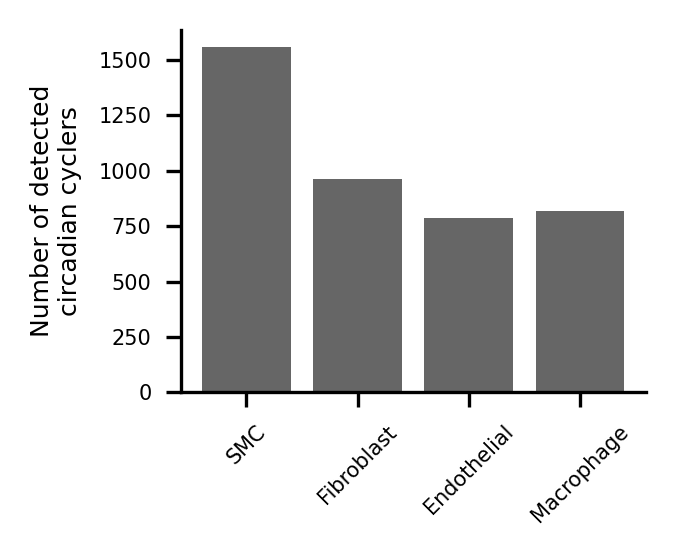

In [8]:
# --- HOW MANY CYCLERS ARE THERE IN EACH CELL TYPE IN MALE? ---


num_cyclers_list = []
for cluster in clusters:
    
    # load params for female controls
    male_gene_log_alpha_df, male_gene_log_beta_df, male_gene_log_min_max_df, male_gene_stat_df = helper_functions.load_param_dfs_from_path(cluster_description_folder_out_dict[cluster]['female misaligned bmal1-control'])

    # get the number of cells
    male_cluster_adata = adata[(adata.obs['cluster'] == cluster) & (adata.obs['description'] == 'female misaligned bmal1-control')]
    
    # get the number of cyclers
    num_cyclers = len(male_gene_stat_df[male_gene_stat_df['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh])
    print(num_cyclers)
    
    # add
    num_cyclers_list.append(num_cyclers)

    
    
# ** viz **
fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
plt.bar(clusters,num_cyclers_list,color='k',alpha=0.6)
# plt.xticks(clusters,['SMC','Fibroblast', 'Endothelial', 'Macrophage', 'Unknown1','Unknown2','Unknown3'],rotation=45)
plt.xticks(clusters,list(map(lambda x: cluster_cell_type_dict[x],clusters)),rotation=45)
sns.despine()
plt.ylabel("Number of detected\ncircadian cyclers")
fileout = '%s/num_cyclers_per_cluster.pdf' % folder_out
plt.savefig(fileout,bbox_inches='tight')
plt.show()









In [21]:
# --- TEMP: SET THE CLUSTER --- 

cluster = 0



In [22]:
# --- SET THE CONDITIONS WE WANT TO COMPARE ---

condit_1 = 'female aligned bmal1-control'
condit_2 = 'female misaligned bmal1-control'




In [23]:
# --- LOAD PARAMS ---

# ** load the parameters for the two conditions **
gene_log_alpha_df_1, gene_log_beta_df_1, gene_log_min_max_df_1, gene_stat_df_1 = helper_functions.load_param_dfs_from_path(cluster_description_folder_out_dict[cluster][condit_1])
gene_log_alpha_df_2, gene_log_beta_df_2, gene_log_min_max_df_2, gene_stat_df_2 = helper_functions.load_param_dfs_from_path(cluster_description_folder_out_dict[cluster][condit_2])


# ** get the overlap in gene names and restrict **
common_genes = sorted(list(set(gene_log_alpha_df_1.index).intersection(set(gene_log_alpha_df_2.index))))
gene_log_alpha_df_1, gene_log_beta_df_1, gene_log_min_max_df_1, gene_stat_df_1 = gene_log_alpha_df_1.loc[common_genes], gene_log_beta_df_1.loc[common_genes], gene_log_min_max_df_1.loc[common_genes], gene_stat_df_1.loc[common_genes]
gene_log_alpha_df_2, gene_log_beta_df_2, gene_log_min_max_df_2, gene_stat_df_2 = gene_log_alpha_df_2.loc[common_genes], gene_log_beta_df_2.loc[common_genes], gene_log_min_max_df_2.loc[common_genes], gene_stat_df_2.loc[common_genes]


# ** turn into Tensors **

# condit 1
gene_log_min_1 = torch.Tensor(np.array(gene_log_min_max_df_1['log_min'])) 
gene_log_max_1 = torch.Tensor(np.array(gene_log_min_max_df_1['log_max']))
gene_log_alpha_1 = torch.Tensor(np.array(gene_log_alpha_df_1).T)
gene_log_beta_1 = torch.Tensor(np.array(gene_log_beta_df_1).T)

# condit 2
gene_log_min_2 = torch.Tensor(np.array(gene_log_min_max_df_2['log_min'])) 
gene_log_max_2 = torch.Tensor(np.array(gene_log_min_max_df_2['log_max']))
gene_log_alpha_2 = torch.Tensor(np.array(gene_log_alpha_df_2).T)
gene_log_beta_2 = torch.Tensor(np.array(gene_log_beta_df_2).T)




In [24]:
# --- GET SAMPLED WAVEFORMS ---



# get the samples log props
sampled_log_prop_1 = helper_functions.get_log_prop_samples(cluster,condit_1,num_waveform_samples,cluster_description_folder_out_dict,gene_list=common_genes)
sampled_log_prop_2 = helper_functions.get_log_prop_samples(cluster,condit_2,num_waveform_samples,cluster_description_folder_out_dict,gene_list=common_genes)

# get the number of grid points
num_grid_points = sampled_log_prop_1.shape[1]




In [25]:
# --- COMPUTE EXPECTED VALS OF THE MESORS ---

# get
log10_expected_mesor_1 = torch.mean(torch.mean(sampled_log_prop_1,dim=0),dim=0).numpy().flatten() / np.log(10)
log10_expected_mesor_2 = torch.mean(torch.mean(sampled_log_prop_2,dim=0),dim=0).numpy().flatten() / np.log(10)


# add to df
gene_stat_df_1['log10_expected_mesor'] = log10_expected_mesor_1
gene_stat_df_2['log10_expected_mesor'] = log10_expected_mesor_2




In [26]:
# --- GET SAMPLED FFT ---


# ** run FFT **
if use_log_prop_fft:
    sampled_fft_1 = np.fft.fft(sampled_log_prop_1,axis=1)
    sampled_fft_2 = np.fft.fft(sampled_log_prop_2,axis=1)
else:
    sampled_fft_1 = np.fft.fft(torch.exp(sampled_log_prop_1),axis=1)
    sampled_fft_2 = np.fft.fft(torch.exp(sampled_log_prop_2),axis=1)


# ** get circadian index for FFT's **
freqs = np.fft.fftfreq(num_grid_points,d=24.0/num_grid_points)
periods = 1 / freqs
circadian_index = np.where(np.isin(periods,[24]))[0][0]




/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_58539/2337036358.py:15: RuntimeWarning: divide by zero encountered in true_divide
  periods = 1 / freqs


In [27]:
# --- GET THE WAVEFORM DIFFERENCE METRICS ---

# mesor metrics
frac_mesor_samples_larger, mesor_effect = helper_functions.mesor_dif_metrics(sampled_log_prop_1, sampled_log_prop_2)

# amp metrics
frac_amp_samples_larger, amp_effect = helper_functions.amp_dif_metrics(sampled_fft_1, sampled_fft_2, circadian_index)

# acrophase metrics
frac_zero_acrophase_dif_samples, acrophase_effect = helper_functions.acrophase_dif_metrics(sampled_fft_1, sampled_fft_2, circadian_index)

# cosinor metrics
frac_zero_cosinor_dif_samples, cosinor_euclid_effect = helper_functions.cosinor_dif_metrics(sampled_fft_1, sampled_fft_2, circadian_index)





In [28]:
# --- MAKE DIF DF ---

waveform_dif_df = pd.DataFrame()
waveform_dif_df['gene'] = common_genes
waveform_dif_df['frac_mesor_samples_larger'] = frac_mesor_samples_larger
waveform_dif_df['mesor_effect'] = mesor_effect
waveform_dif_df['frac_amp_samples_larger'] = frac_amp_samples_larger
waveform_dif_df['amp_effect'] = amp_effect
waveform_dif_df['frac_zero_acrophase_dif_samples'] = frac_zero_acrophase_dif_samples
waveform_dif_df['acrophase_effect'] = acrophase_effect
waveform_dif_df['condit_1_frac_circadian_samples_crossing_zero'] = np.array(gene_stat_df_1['frac_circadian_samples_crossing_zero'])
waveform_dif_df['condit_2_frac_circadian_samples_crossing_zero'] = np.array(gene_stat_df_2['frac_circadian_samples_crossing_zero'])
waveform_dif_df['condit_1_waveform_over_circadian_component_subtracted_log10_bf'] = np.array(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf'])
waveform_dif_df['condit_2_waveform_over_circadian_component_subtracted_log10_bf'] = np.array(gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf'])

waveform_dif_df = waveform_dif_df.set_index('gene')
waveform_dif_df



,frac_mesor_samples_larger,mesor_effect,frac_amp_samples_larger,amp_effect,frac_zero_acrophase_dif_samples,acrophase_effect,condit_1_frac_circadian_samples_crossing_zero,condit_2_frac_circadian_samples_crossing_zero,condit_1_waveform_over_circadian_component_subtracted_log10_bf,condit_2_waveform_over_circadian_component_subtracted_log10_bf
gene,,,,,,,,,,
0610005C13Rik,0.610000,0.077996,0.530000,0.016127,0.376667,1.020913,0.24,0.37,-0.634000,-1.017029
0610009B22Rik,0.390000,-0.064457,0.236667,-0.296633,0.276667,0.368773,0.03,0.23,15.432722,-6.787124
0610009E02Rik,0.336667,-0.131109,0.483333,-0.036220,0.333333,-2.165623,0.23,0.32,-7.756281,-1.759921
0610009L18Rik,0.326667,-0.070011,0.513333,-0.000728,0.346667,0.456788,0.12,0.18,-68.335220,-4.727193
0610010F05Rik,0.873333,0.194585,0.560000,0.063134,0.450000,0.029778,0.28,0.18,-36.885340,-23.702555
...,...,...,...,...,...,...,...,...,...,...
mt-Nd3,0.110000,-0.150281,0.193333,-0.249271,0.210000,-1.006621,0.05,0.31,385.287050,-246.032910
mt-Nd4,0.770000,0.092976,0.560000,0.046606,0.386667,1.650824,0.47,0.35,-732.834600,-391.669160
mt-Nd4l,0.650000,0.048964,0.553333,0.037209,0.190000,2.023907,0.38,0.29,-321.282900,-6.175125


In [29]:
# --- CALL GENES WITH DIFFERING CIRCADIAN WAVEFORMS ---



# mesor 
mesor_increased = np.array(waveform_dif_df['frac_mesor_samples_larger'] >= mesor_frac_thresh) & np.array(waveform_dif_df['mesor_effect'] >= mesor_effect_thresh)
mesor_decreased = np.array(waveform_dif_df['frac_mesor_samples_larger'] <= 1 - mesor_frac_thresh) & np.array(waveform_dif_df['mesor_effect'] <= -1 * mesor_effect_thresh)

# amp
amp_increased = np.array(gene_stat_df_2['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh) & np.array(waveform_dif_df['frac_amp_samples_larger'] >= amp_frac_thresh) & np.array(waveform_dif_df['amp_effect'] >= amp_effect_thresh)
amp_decreased = np.array(gene_stat_df_1['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh) & np.array(waveform_dif_df['frac_amp_samples_larger'] <= 1 - amp_frac_thresh) & np.array(waveform_dif_df['amp_effect'] <= -1 * amp_effect_thresh)

# acrophase
acrophase_delayed = np.array(gene_stat_df_1['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh) & np.array(gene_stat_df_2['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh) & np.array(waveform_dif_df['frac_zero_acrophase_dif_samples'] <= acrophase_frac_thresh) & np.array(waveform_dif_df['acrophase_effect'] > 0) & np.array(np.abs(waveform_dif_df['acrophase_effect']) >= acrophase_effect_thresh)
acrophase_advanced = np.array(gene_stat_df_1['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh) & np.array(gene_stat_df_2['frac_circadian_samples_crossing_zero'] <= frac_circadian_samples_crossing_zero_thresh) & np.array(waveform_dif_df['frac_zero_acrophase_dif_samples'] <= acrophase_frac_thresh) & np.array(waveform_dif_df['acrophase_effect'] < 0) & np.array(np.abs(waveform_dif_df['acrophase_effect']) >= acrophase_effect_thresh)

# add to df
waveform_dif_df['mesor_increased'] = mesor_increased
waveform_dif_df['mesor_decreased'] = mesor_decreased
waveform_dif_df['amp_increased'] = amp_increased
waveform_dif_df['amp_decreased'] = amp_decreased
waveform_dif_df['acrophase_delayed'] = acrophase_delayed
waveform_dif_df['acrophase_advanced'] = acrophase_advanced

# gene lists
mesor_increased_genes = list(waveform_dif_df[waveform_dif_df['mesor_increased']].sort_values('mesor_effect',ascending=False).index)
mesor_decreased_genes = list(waveform_dif_df[waveform_dif_df['mesor_decreased']].sort_values('mesor_effect',ascending=True).index)
amp_increased_genes = list(waveform_dif_df[waveform_dif_df['amp_increased']].sort_values('amp_effect',ascending=False).index)
amp_decreased_genes = list(waveform_dif_df[waveform_dif_df['amp_decreased']].sort_values('amp_effect',ascending=True).index)
# amp_increased_genes = list(waveform_dif_df[waveform_dif_df['amp_increased']].sort_values('frac_amp_samples_larger',ascending=False).index)
# amp_decreased_genes = list(waveform_dif_df[waveform_dif_df['amp_decreased']].sort_values('frac_amp_samples_larger',ascending=True).index)
acrophase_delayed_genes = list(waveform_dif_df[waveform_dif_df['acrophase_delayed']].sort_values('acrophase_effect',ascending=False).index)
acrophase_advanced_genes = list(waveform_dif_df[waveform_dif_df['acrophase_advanced']].sort_values('acrophase_effect',ascending=True).index)





# print out the counts
print('mesor_increased', np.sum(waveform_dif_df['mesor_increased']))
print('mesor_decreased', np.sum(waveform_dif_df['mesor_decreased']))
print('amp_increased', np.sum(waveform_dif_df['amp_increased']))
print('amp_decreased', np.sum(waveform_dif_df['amp_decreased']))
print('acrophase_delayed', np.sum(waveform_dif_df['acrophase_delayed']))
print('acrophase_advanced', np.sum(waveform_dif_df['acrophase_advanced']))




mesor_increased 573
mesor_decreased 524
amp_increased 43
amp_decreased 35
acrophase_delayed 175
acrophase_advanced 58


In [30]:
# --- WRITE OUT WAVEFORM DIF DF ---


subfolder_out = '%s/waveform_dif_dfs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.tsv' % (subfolder_out,cluster_cell_type_dict[cluster])
waveform_dif_df.to_csv(fileout,sep='\t')



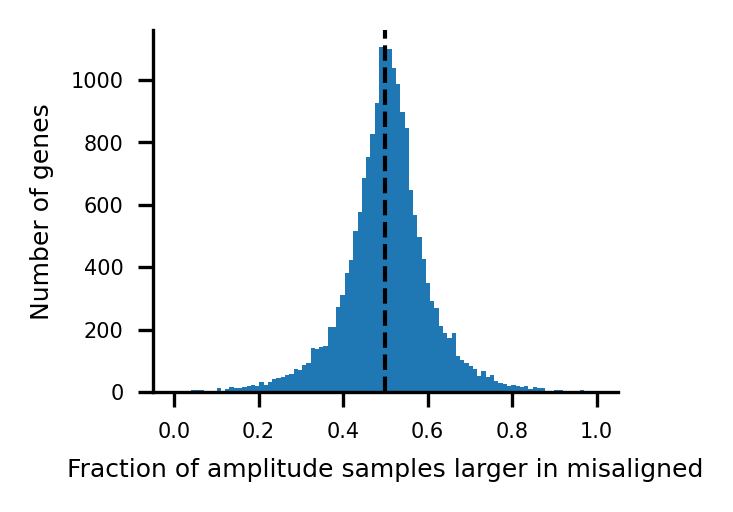

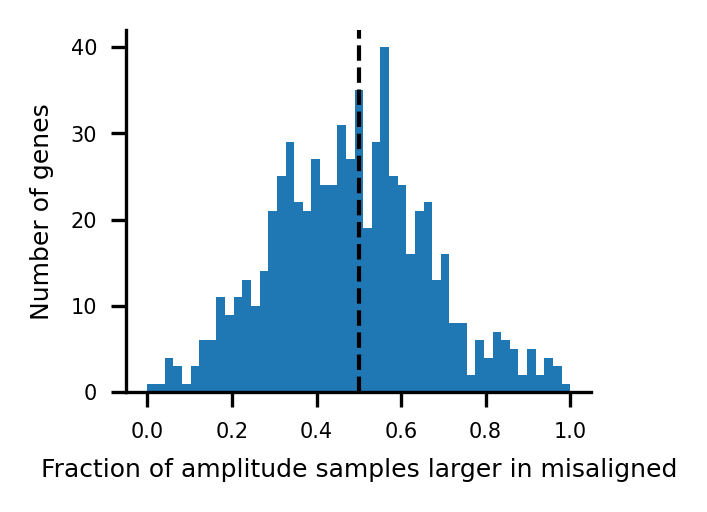

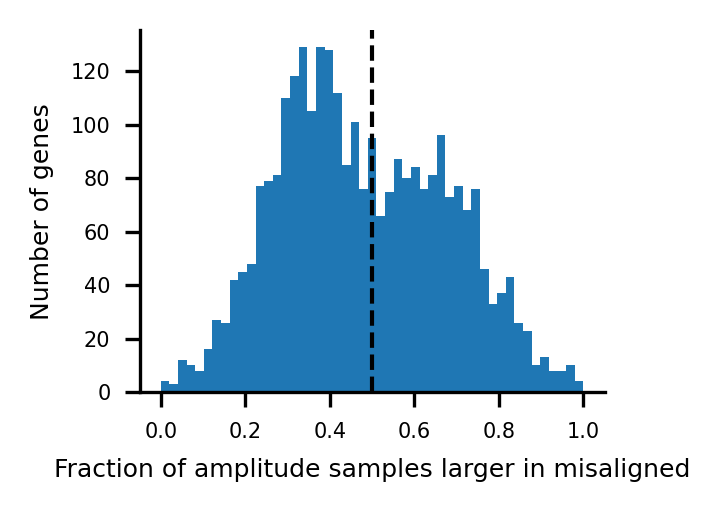

In [31]:
# --- LOOK TO SEE IF THE AMPLITUDES ARE SHIFTED IN MISALIGNED ---

fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(waveform_dif_df['frac_amp_samples_larger'],bins=np.linspace(0,1,100))
plt.xlabel("Fraction of amplitude samples larger in misaligned")
plt.ylabel("Number of genes")
plt.axvline(x = 0.5,c='k',linestyle='--')
subfolder_out = '%s/misaligned_amp_frac_greater_dist_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()





union_cyclers = np.array((gene_stat_df_1[(gene_stat_df_1['frac_circadian_samples_crossing_zero'] <= 0.1) | (gene_stat_df_2['frac_circadian_samples_crossing_zero'] <= 0.1)]).index)
inter_cyclers = np.array((gene_stat_df_1[(gene_stat_df_1['frac_circadian_samples_crossing_zero'] <= 0.1) & (gene_stat_df_2['frac_circadian_samples_crossing_zero'] <= 0.1)]).index)



fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(waveform_dif_df['frac_amp_samples_larger'].loc[inter_cyclers],bins=np.linspace(0,1,50))
plt.xlabel("Fraction of amplitude samples larger in misaligned")
plt.ylabel("Number of genes")
plt.axvline(x = 0.5,c='k',linestyle='--')
subfolder_out = '%s/misaligned_intersection_cyclers_amp_frac_greater_dist_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.hist(waveform_dif_df['frac_amp_samples_larger'].loc[union_cyclers],bins=np.linspace(0,1,50))
plt.xlabel("Fraction of amplitude samples larger in misaligned")
plt.ylabel("Number of genes")
plt.axvline(x = 0.5,c='k',linestyle='--')
subfolder_out = '%s/misaligned_union_cyclers_amp_frac_greater_dist_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


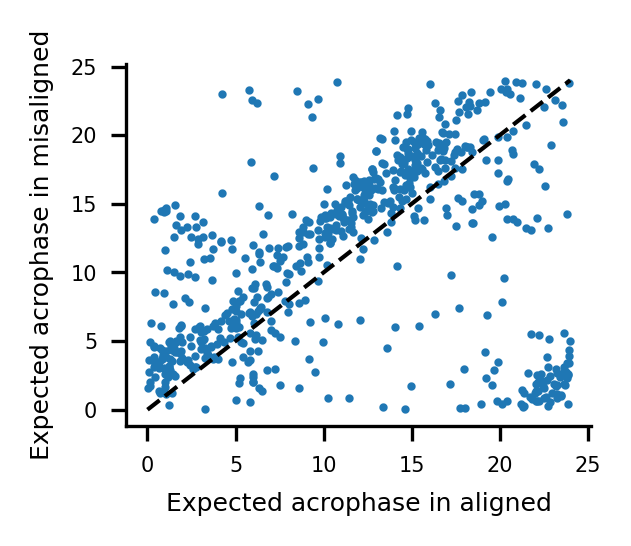

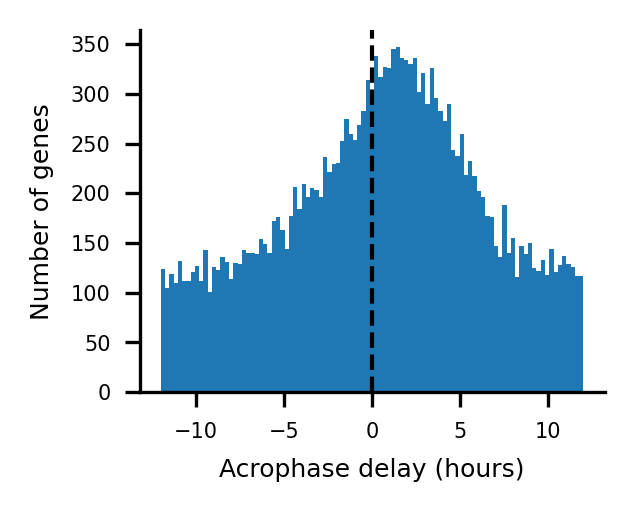

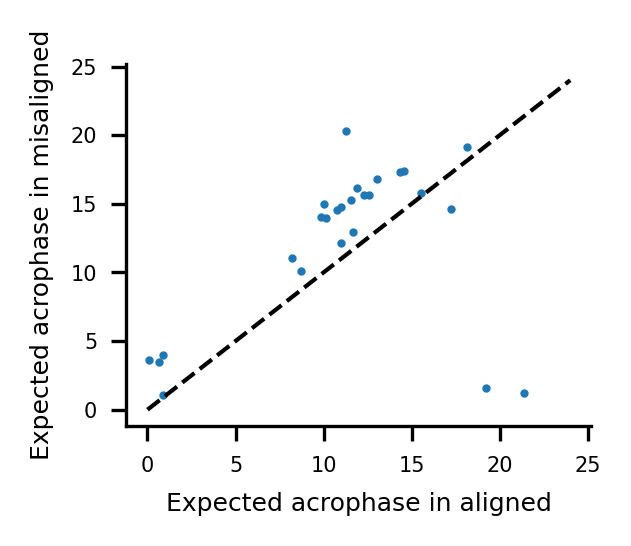

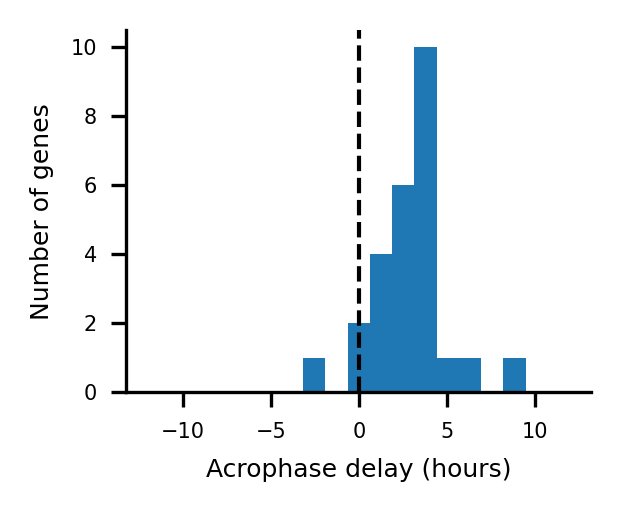

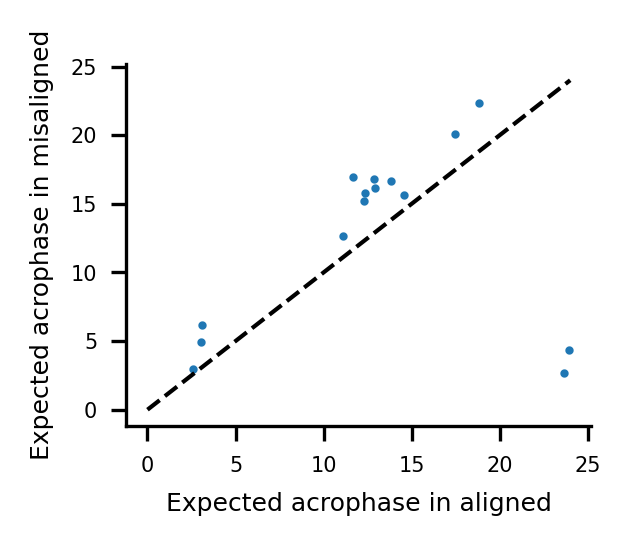

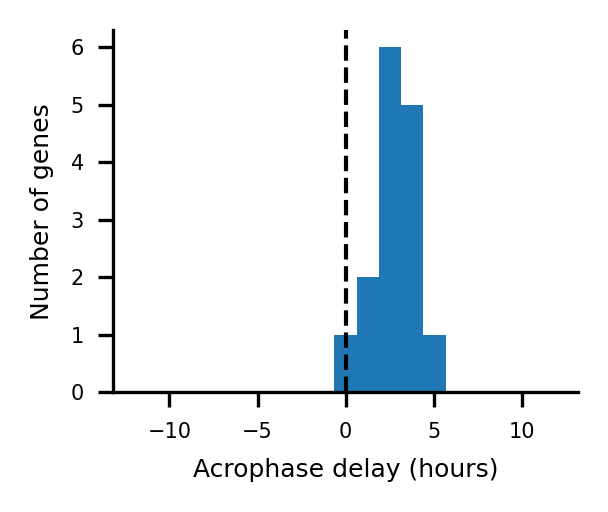

In [33]:
# --- lOOK AT THE ACROPHASES ---

# ** compute expected acrophases **
expected_acrophase_1 = scipy.stats.circmean(np.arctan2(sampled_fft_1[:,circadian_index].imag,sampled_fft_1[:,circadian_index].real) % (2 * np.pi),axis=0)
expected_acrophase_2 = scipy.stats.circmean(np.arctan2(sampled_fft_2[:,circadian_index].imag,sampled_fft_2[:,circadian_index].real) % (2 * np.pi),axis=0)
expected_acrophase_1 = ((2 * np.pi) - expected_acrophase_1) % (2 * np.pi)
expected_acrophase_2 = ((2 * np.pi) - expected_acrophase_2) % (2 * np.pi)
expected_acrophase_1 = (expected_acrophase_1 / np.pi) * 12.0
expected_acrophase_2 = (expected_acrophase_2 / np.pi) * 12.0

# ** get expected acrophase df **
acro_df = pd.DataFrame()
acro_df['gene'] = common_genes
acro_df['acro_1'] = expected_acrophase_1
acro_df['acro_2'] = expected_acrophase_2
acro_df = acro_df.set_index("gene")

# ** compute the expected acrophase delay **
acro_dif = acro_df['acro_2'] - acro_df['acro_1']
acro_dif = acro_dif % (24.0)
acro_dif[acro_dif > 12] = acro_dif[acro_dif > 12] - 24
acro_df['acro_delay'] = np.array(acro_dif)



# ** plot **
fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(acro_df.loc[inter_cyclers]['acro_1'],acro_df.loc[inter_cyclers]['acro_2'],s=1)
plt.plot(np.linspace(0,24,100),np.linspace(0,24,100),c='k',alpha=1.0,linestyle='--')
plt.xlabel("Expected acrophase in aligned")
plt.ylabel("Expected acrophase in misaligned")
subfolder_out = '%s/misaligned_vs_aligned_acrophase_inter_cyclers_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


# ** plot the difs **
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
sns.despine()
plt.hist(acro_df['acro_delay'],bins=np.linspace(-12,12,100))
plt.xlabel("Acrophase delay (hours)")
plt.ylabel("Number of genes")
plt.axvline(x = 0,c='k',linestyle='--')
fileout = '%s/acro_dif_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()



# ** plot for core clock genes only **
core_clock_genes = [
    "Arntl",
    "Arntl2",
    "Clock",
    "Per1",
    "Per2",
    "Per3",
    "Cry1",
    "Cry2",
    "Nampt",
    "Rorc",
    "Rora",
    "Nr1d1",
    "Nr1d2",
    "Npas2",
    'Fbxo3', 
    'Fbxo21', 
    'Gm129', 
    'Dbp', 
    'Tef', 
    'Hlf', 
    'Csnk1a1', 
    'Csnk1d', 
    'Csnk1e',
    'Ciart',
    'Bhlhe40', # questionably clock gene...
    'Bhlhe41',
    "Dec1",
    "Dec2",
    'Nfil3']
core_clock_genes = list(filter(lambda x: x in common_genes,core_clock_genes))


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(acro_df.loc[core_clock_genes]['acro_1'],acro_df.loc[core_clock_genes]['acro_2'],s=1)
plt.plot(np.linspace(0,24,100),np.linspace(0,24,100),c='k',alpha=1.0,linestyle='--')
plt.xlabel("Expected acrophase in aligned")
plt.ylabel("Expected acrophase in misaligned")
subfolder_out = '%s/misaligned_vs_aligned_acrophase_clock_genes_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


# ** plot the difs **
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
sns.despine()
plt.hist(acro_df['acro_delay'].loc[core_clock_genes],bins=np.linspace(-12,12,20))
plt.xlabel("Acrophase delay (hours)")
plt.ylabel("Number of genes")
plt.axvline(x = 0,c='k',linestyle='--')
fileout = '%s/acro_dif_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()




# ** plot for ubiqitous cycling genes only **
ubiq_genes = [
    "CDKN1A",
    "MMP14",
    "POR",
    "WEE1",
    "SLC16A1",
    "TSC22D3",
    "NA",
    "TENC1",
    "USP2",
    "FMO2",
    "TSPAN4",
    "LEO1",
    "TMEM57",
    "STK35",
    "LONRF3",
    "GRAMD4",
    "COQ10B",
    "DTX4",
    "C1orf51"
    ]

ubiq_genes = list(map(lambda x: x.lower().capitalize(), ubiq_genes))
ubiq_genes = list(filter(lambda x: x in common_genes,ubiq_genes))


fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(acro_df.loc[ubiq_genes]['acro_1'],acro_df.loc[ubiq_genes]['acro_2'],s=1)
plt.plot(np.linspace(0,24,100),np.linspace(0,24,100),c='k',alpha=1.0,linestyle='--')
plt.xlabel("Expected acrophase in aligned")
plt.ylabel("Expected acrophase in misaligned")
subfolder_out = '%s/misaligned_vs_aligned_acrophase_ubiq_cyclers_figs' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


# ** plot the difs **
fig,ax=plt.subplots(figsize=(2,1.6),dpi=300)
sns.despine()
plt.hist(acro_df['acro_delay'].loc[ubiq_genes],bins=np.linspace(-12,12,20))
plt.xlabel("Acrophase delay (hours)")
plt.ylabel("Number of genes")
plt.axvline(x = 0,c='k',linestyle='--')
fileout = '%s/acro_dif_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.show()


 
    
    


In [81]:
# --- SET THE GENE ENRICHMENT SETS ---

import gseapy
enrichment_gene_sets = ['GO_Biological_Process_2018','KEGG_2016', 'ENCODE_and_ChEA_Consensus_TFs_from_ChIP-X']



In [82]:
# --- GET THE GENE SET LIST OF LISTS ---


de_gene_set_list = [mesor_increased_genes,
                    mesor_decreased_genes,
                    amp_increased_genes,
                    amp_decreased_genes, 
                    acrophase_delayed_genes, 
                    acrophase_advanced_genes]
de_gene_set_name_list = ['mesor_increased',
                         'mesor_decreased',
                         'amp_increased',
                         'amp_decreased', 
                         'acrophase_delayed', 
                         'acrophase_advanced']



In [84]:
# --- LOOK AT PATHWAY ENRICHMENT FOR THE DE GENE SETS ---

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

for de_gene_set,de_gene_set_name in zip(de_gene_set_list,de_gene_set_name_list):
    for enrichment_gene_set in enrichment_gene_sets:
        
        # continue if nothing
        if len(enrichment_gene_set) == 0:
            continue
        
        
        # make the subfolder
        subfolder_out = '%s/%s_enrichment/%s' % (folder_out,de_gene_set_name,enrichment_gene_set)
        if not os.path.exists(subfolder_out):
            os.makedirs(subfolder_out)


        
        # move on if no genes
        if len(de_gene_set) == 0:
            continue


        # get enrichment results
        res = gseapy.enrichr(gene_list=de_gene_set,
                             gene_sets = enrichment_gene_set,
                            organism = 'mouse',
                            background=list(reg_genes_to_est))


        # get the DF
        fileout = '%s/cluster_%s_enrichment.tsv' % (subfolder_out,cluster_cell_type_dict[cluster])
        res_df = res.results
        res_df = res_df.set_index("Gene_set")
        res_df.to_csv(fileout,sep='\t')


    
    


2022-09-01 14:19:51,658 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2022-09-01 14:19:58,294 Warning: No enrich terms using library ENCODE_and_ChEA_Consensus_TFs_from_ChIP-X when cutoff = 0.05
2022-09-01 14:20:11,615 Warning: No enrich terms using library KEGG_2016 when cutoff = 0.05
2022-09-01 14:20:13,763 Warning: No enrich terms using library ENCODE_and_ChEA_Consensus_TFs_from_ChIP-X when cutoff = 0.05
2022-09-01 14:20:20,197 Warning: No enrich terms using library ENCODE_and_ChEA_Consensus_TFs_from_ChIP-X when cutoff = 0.05
2022-09-01 14:20:22,360 Warning: No enrich terms using library GO_Biological_Process_2018 when cutoff = 0.05
2022-09-01 14:20:24,619 Warning: No enrich terms using library KEGG_2016 when cutoff = 0.05
2022-09-01 14:20:26,581 Warning: No enrich terms using library ENCODE_and_ChEA_Consensus_TFs_from_ChIP-X when cutoff = 0.05
2022-09-01 14:20:31,308 Warning: No enrich terms using library KEGG_2016 when cutoff = 0.05


In [85]:
# --- LOAD ADATAS ---

# ** condit 1 **
cluster_adata_1 = adata[(adata.obs['description'] == condit_1) & (adata.obs['cluster'] == cluster)]
cluster_adata_1 = cluster_adata_1[:,common_genes]

# ** condit 2 **
cluster_adata_2 = adata[(adata.obs['description'] == condit_2) & (adata.obs['cluster'] == cluster)]
cluster_adata_2 = cluster_adata_2[:,common_genes]




In [86]:
# --- UPDATE THE LISTS TO INCLUDE GENES OF INTEREST ---

de_gene_set_name_list += ['genes_of_interest']
de_gene_set_list.append(['Arntl', 'Dbp', 'Ccr2','Ccl2','Ptgs2','Ptges3l','Ptgfr','Hpgd','Ptafr','Rock2', 'Rac1', 'Nrf2', 'Bcl2', 'Fam107a', 'Ifit3'])





/var/folders/y2/0zd17m8j6bz5j5xv0cy2dw680000gp/T/ipykernel_74660/1428895081.py:79: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize = (3,1.6),dpi=300)


Ptgfr not in common genes
Nrf2 not in common genes
Fam107a not in common genes


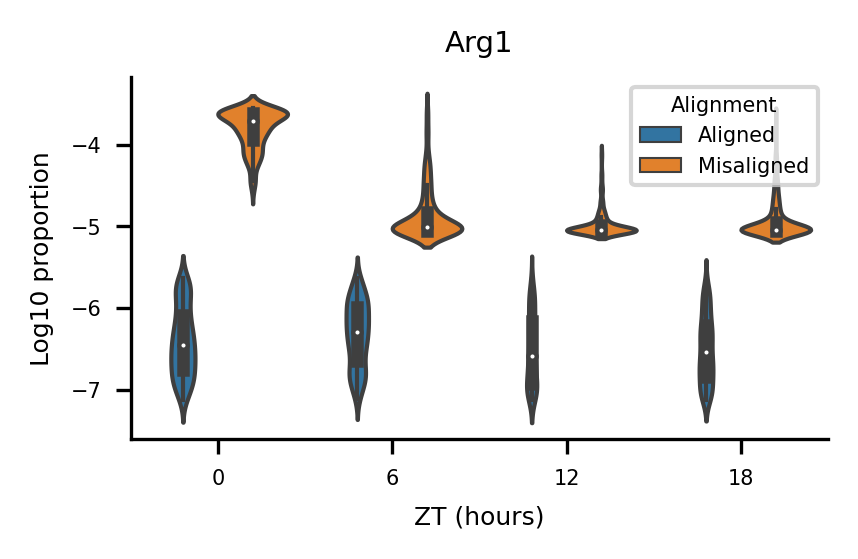

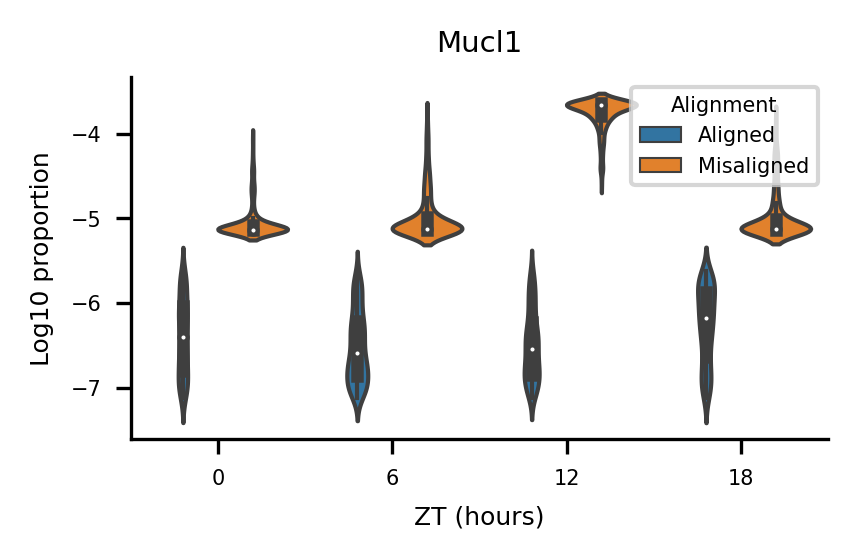

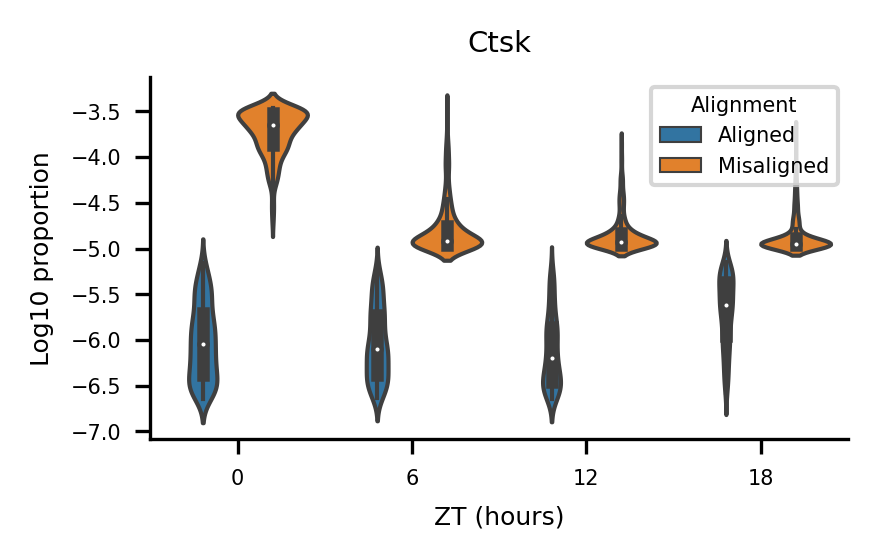

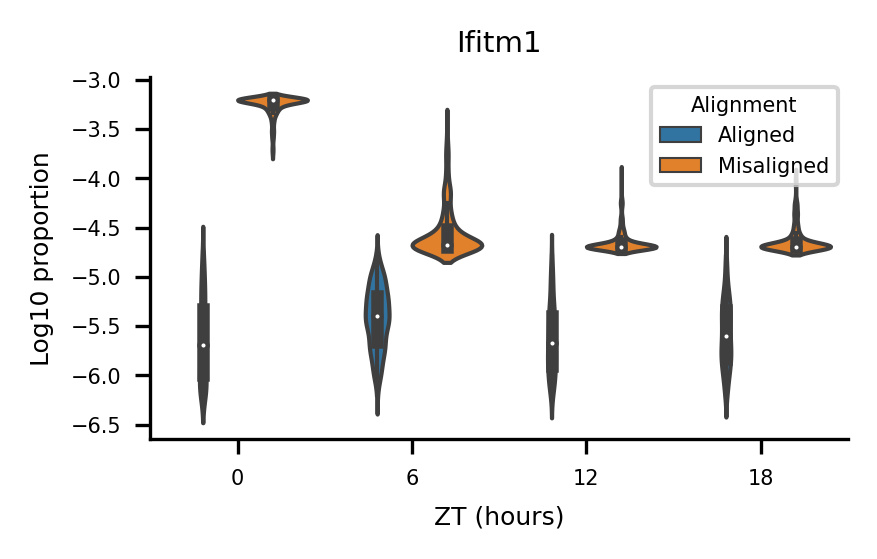

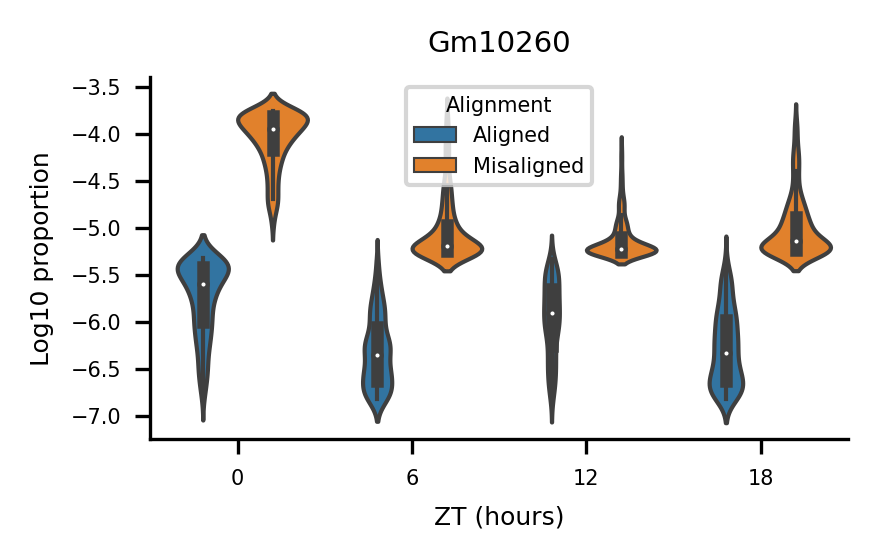

...

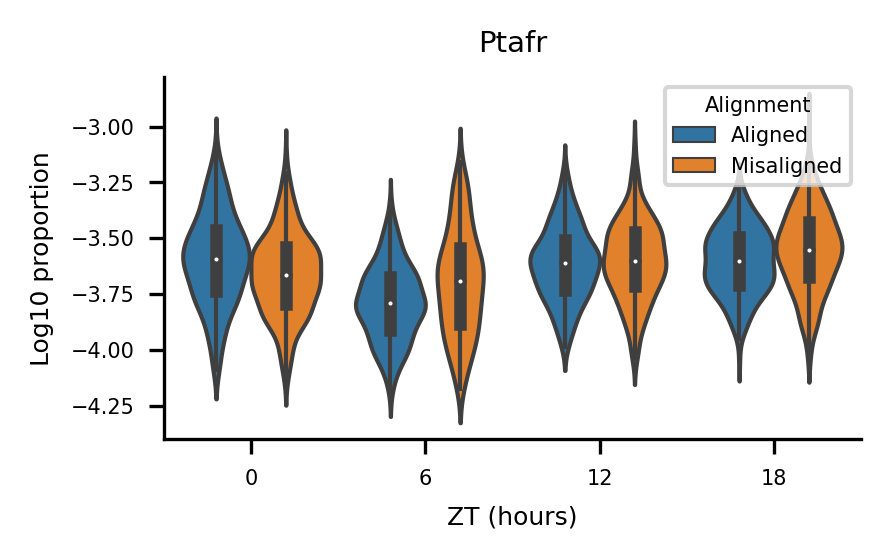

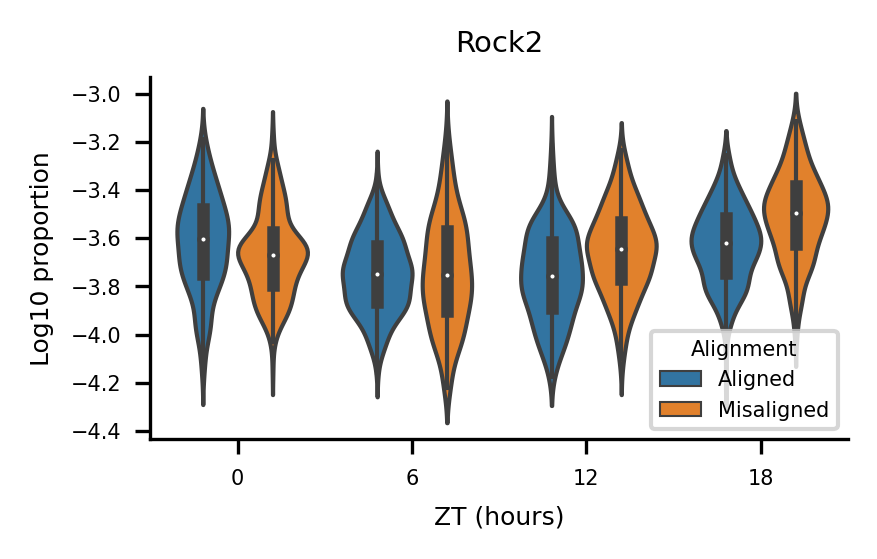

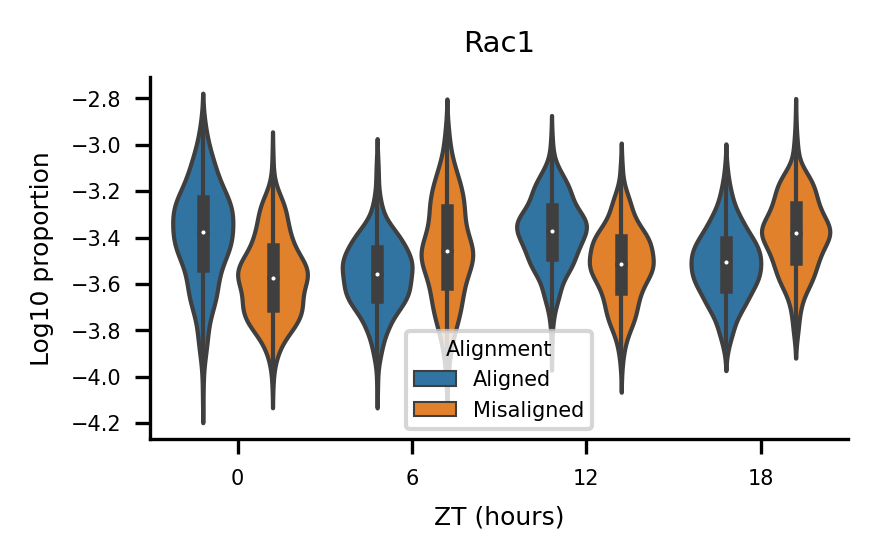

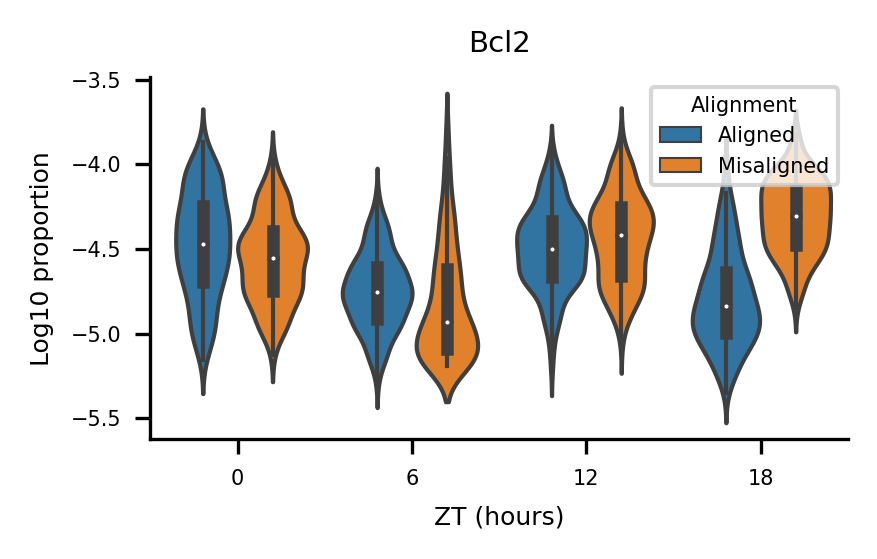

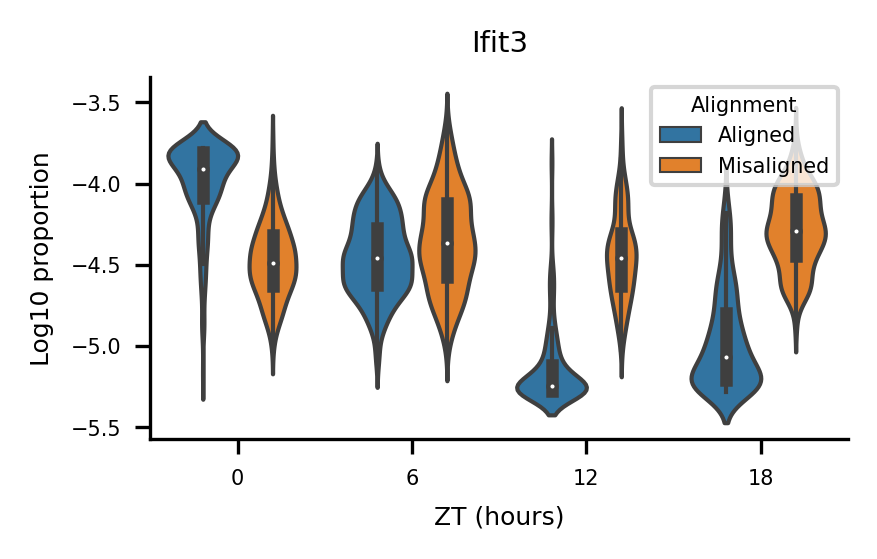

In [87]:
# --- VIZ EXAMPLES FOR TOP DIFF WAVEFORM GENES ---


num_genes_per_set = 30
for de_gene_set, de_gene_set_name in zip(de_gene_set_list, de_gene_set_name_list):
    
    # take only a subset of the genes (unless gene set of interest)
    de_gene_set_subset = de_gene_set
    if de_gene_set_name != 'genes_of_interest':
        de_gene_set_subset = de_gene_set[:min(len(de_gene_set),num_genes_per_set)]
        
    
    for z, gene_of_interest in enumerate(de_gene_set_subset):

        
        # ** make the folder out **
        subfolder_out = '%s/example_de_waveform_genes/%s/%s' % (folder_out, cluster_cell_type_dict[cluster], de_gene_set_name)
        if not os.path.exists(subfolder_out):
            os.makedirs(subfolder_out)

        
        # ** get the gene index **
        if gene_of_interest not in common_genes:
            print("%s not in common genes" % gene_of_interest)
            continue
        gene_index = np.where(np.array(common_genes) == gene_of_interest)[0]


#         # ** pseudobulk props **

#         # make fig
#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()

#         # condit 1
#         props = []
#         for zt in [0,6,12,18]:
#             zt_adata = cluster_adata_1[cluster_adata_1.obs['zt'] == zt]
#             prop = np.sum(zt_adata[:,gene_of_interest].X) / np.sum(zt_adata.obs['lib_size'])
#             props.append(prop)
#         plt.scatter([0,6,12,18],np.log10(np.array(props)),s=1,label=condit_1)
#         plt.xlabel("ZT (hours)")

#         # condit 2
#         props = []
#         for zt in [0,6,12,18]:
#             zt_adata = cluster_adata_2[cluster_adata_2.obs['zt'] == zt]
#             prop = np.sum(zt_adata[:,gene_of_interest].X) / np.sum(zt_adata.obs['lib_size'])
#             props.append(prop)
#         plt.scatter([0,6,12,18],np.log10(np.array(props)),s=1,label=condit_2)
#         plt.xlabel("ZT (hours)")
#         plt.ylabel("Log10 proportion")

#         # viz
#         plt.title(gene_of_interest)
#         plt.legend()
        
        
        
        # ** prop distribs over time **
        
        # make gene df
        val_mat = torch.cat((sampled_log_prop_1[:,:,gene_index.item()].unsqueeze(2),sampled_log_prop_2[:,:,gene_index.item()].unsqueeze(2)),dim=2)
        time_mat = np.zeros((num_waveform_samples, 4,2))
        time_mat[:,0,:] = 0
        time_mat[:,1,:] = 6
        time_mat[:,2,:] = 12
        time_mat[:,3,:] = 18
        hue_mat = np.zeros((num_waveform_samples, 4,2)).astype(str)
        hue_mat[:,:,0] = 'Aligned'
        hue_mat[:,:,1] = 'Misaligned'
        gene_df = pd.DataFrame()
        gene_df['ZT'] = time_mat.flatten().astype(int)
        gene_df['Alignment'] = hue_mat.flatten()
        gene_df['Log10 prop'] = val_mat.flatten().numpy() / np.log(10)


        # viz
        fig, ax = plt.subplots(figsize = (3,1.6),dpi=300)
        sns.despine()
        sns.violinplot(x="ZT", y="Log10 prop", data=gene_df,ax=ax,hue='Alignment')
        plt.xlabel("ZT (hours)")
        plt.ylabel("Log10 proportion")
        fileout='%s/%s_%s.pdf' % (subfolder_out,z,gene_of_interest)
        plt.title(gene_of_interest)
        plt.savefig(fileout,bbox_inches='tight')
        # plt.show()

        



#         # ** mesor distributions **

#         log10_mesor_samples_1 = torch.mean(sampled_log_prop_1,dim=1)[:,gene_index].numpy().flatten() / np.log(10)
#         log10_mesor_samples_2 = torch.mean(sampled_log_prop_2,dim=1)[:,gene_index].numpy().flatten() / np.log(10)
#         min_val = min(np.min(log10_mesor_samples_1),np.min(log10_mesor_samples_2)) - 0.5
#         max_val = max(np.max(log10_mesor_samples_1),np.max(log10_mesor_samples_2)) + 0.5


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(log10_mesor_samples_1,bins=np.linspace(min_val,max_val,100))
#         plt.xlabel("Log10 mesor")
#         plt.ylabel("Number of samples")
#         plt.title("%s for %s" % (condit_1, gene_of_interest))
#         plt.show()



#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(log10_mesor_samples_2,bins=np.linspace(min_val,max_val,100))
#         plt.xlabel("Log10 mesor")
#         plt.ylabel("Number of samples")
#         plt.title("%s for %s" % (condit_2, gene_of_interest))
#         plt.show()


#         # ** amplitude distributions **


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(abs(sampled_fft_1)[:,circadian_index,gene_index].flatten() / np.log(10),bins=np.linspace(0,2,100))
#         plt.xlabel("Log10 amplitude")
#         plt.ylabel("Number of samples")
#         plt.title("Male circadian amplitude posterior for %s" % gene_of_interest)
#         plt.show()


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist(abs(sampled_fft_2)[:,circadian_index,gene_index].flatten() / np.log(10),bins=np.linspace(0,2,100))
#         plt.xlabel("Log10 amplitude")
#         plt.ylabel("Number of samples")
#         plt.title("Female circadian amplitude posterior for %s" % gene_of_interest)
#         plt.show()



#         # ** get acrophase samples **
#         acrophase_samples_1 = (np.arctan2(sampled_fft_1[:,circadian_index.item(),gene_index].imag,sampled_fft_1[:,circadian_index.item(),gene_index].real) % (2 * np.pi))
#         acrophase_samples_2 = (np.arctan2(sampled_fft_2[:,circadian_index.item(),gene_index].imag,sampled_fft_2[:,circadian_index.item(),gene_index].real) % (2 * np.pi))


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist((acrophase_samples_1 / np.pi) * 12.0,bins=np.linspace(0,24,100))
#         plt.xlabel("Acrophase (hours)")
#         plt.ylabel("Number of samples")
#         plt.title("Male circadian acrophase posterior for %s" % gene_of_interest)
#         plt.show()


#         fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
#         sns.despine()
#         plt.hist((acrophase_samples_2 / np.pi) * 12.0,bins=np.linspace(0,24,100))
#         plt.xlabel("Acrophase (hours)")
#         plt.ylabel("Number of samples")
#         plt.title("Female circadian acrophase posterior for %s" % gene_of_interest)
#         plt.show()

        





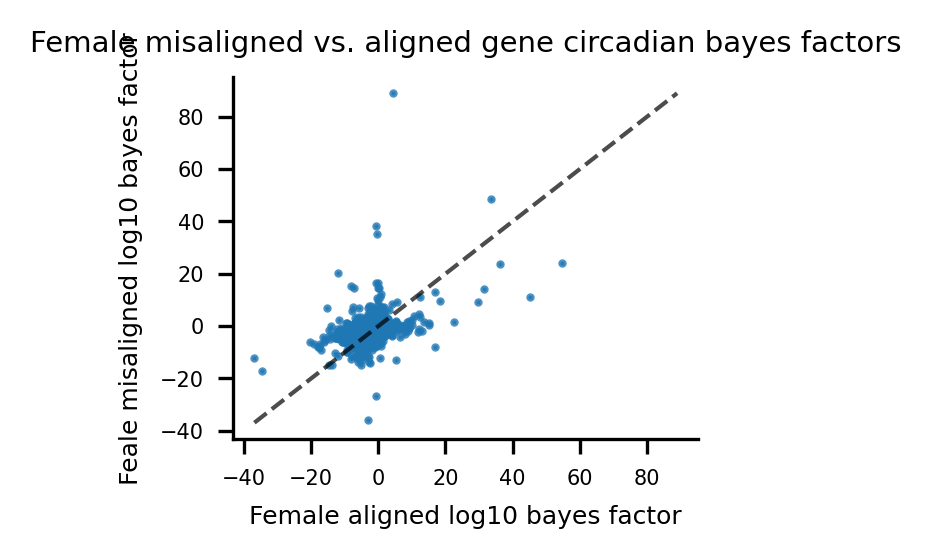

In [88]:
# --- VIZ THE RELATIONSHIP BETWEEN CIRCADIAN BF'S ---

min_val = min(np.min(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf']), np.min(gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf']))
max_val = max(np.max(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf']), np.max(gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf']))

fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
sns.despine()
plt.scatter(gene_stat_df_1['waveform_over_circadian_component_subtracted_log10_bf'],gene_stat_df_2['waveform_over_circadian_component_subtracted_log10_bf'],s=1,alpha=0.8)
plt.plot(np.linspace(min_val,max_val,1000),np.linspace(min_val,max_val,1000),c='k',alpha=0.7,linestyle='--')
plt.xlabel("Female aligned log10 bayes factor")
plt.ylabel("Feale misaligned log10 bayes factor")
subfolder_out = '%s/female_misaligned_vs_aligned_bayes_factor_fig' % folder_out
if not os.path.exists(subfolder_out):
    os.makedirs(subfolder_out)
fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
plt.savefig(fileout,bbox_inches='tight')
plt.title("Female misaligned vs. aligned gene circadian bayes factors")
plt.show()















In [89]:
# # --- VIZ THE RELATIONSHIP BETWEEN FRACTION NON-ZERO SAMPLES ---

# min_val = min(np.min(gene_stat_df_1['frac_circadian_samples_crossing_zero']), np.min(gene_stat_df_2['frac_circadian_samples_crossing_zero']))
# max_val = max(np.max(gene_stat_df_1['frac_circadian_samples_crossing_zero']), np.max(gene_stat_df_2['frac_circadian_samples_crossing_zero']))

# fig, ax = plt.subplots(figsize = (2,1.6),dpi=300)
# sns.despine()
# plt.scatter(gene_stat_df_1['frac_circadian_samples_crossing_zero'],gene_stat_df_2['frac_circadian_samples_crossing_zero'],s=1,alpha=0.8)
# plt.plot(np.linspace(min_val,max_val,1000),np.linspace(min_val,max_val,1000),c='k',alpha=0.7,linestyle='--')
# plt.xlabel("Male aligned fraction zero circadian cosinor samples")
# plt.ylabel("Male misaligned fraction zero circadian cosinor samples")
# subfolder_out = '%s/male_misaligned_vs_aligned_frac_zero_cosinor_samples_fig' % folder_out
# if not os.path.exists(subfolder_out):
#     os.makedirs(subfolder_out)
# fileout = '%s/cluster_%s.pdf' % (subfolder_out,cluster_cell_type_dict[cluster])
# plt.savefig(fileout,bbox_inches='tight')
# plt.title("Male misaligned vs. aligned fraction zero circadian cosinor samples")
# plt.show()













